In [1]:
import xgi
import hypercontagion as hc
import matplotlib.pyplot as plt
import time
import numpy as np
import random
import networkx as nx
from IPython.display import HTML
import matplotlib.animation as animation

In [ ]:
H1 = xgi.load_xgi_data("diseasome")
H1.cleanup()

In [ ]:
print(H1.number_of_nodes())
print(H1.number_of_edges())
print(H1.number_of_hyperedges())

[2, 3, 4, 5, 6, 7, 8, 9, 10, 11]

In [4]:
gamma = 0.05
beta = 0.05
tau = {i: beta for i in xgi.unique_edge_sizes(H)}
rho = 0.1

In [5]:
transition_events = hc.discrete_SIR(
    H, tau, gamma, tmin=0, dt=1, rho=rho, return_event_data=True
)

In [6]:
pos = xgi.pairwise_spring_layout(H)

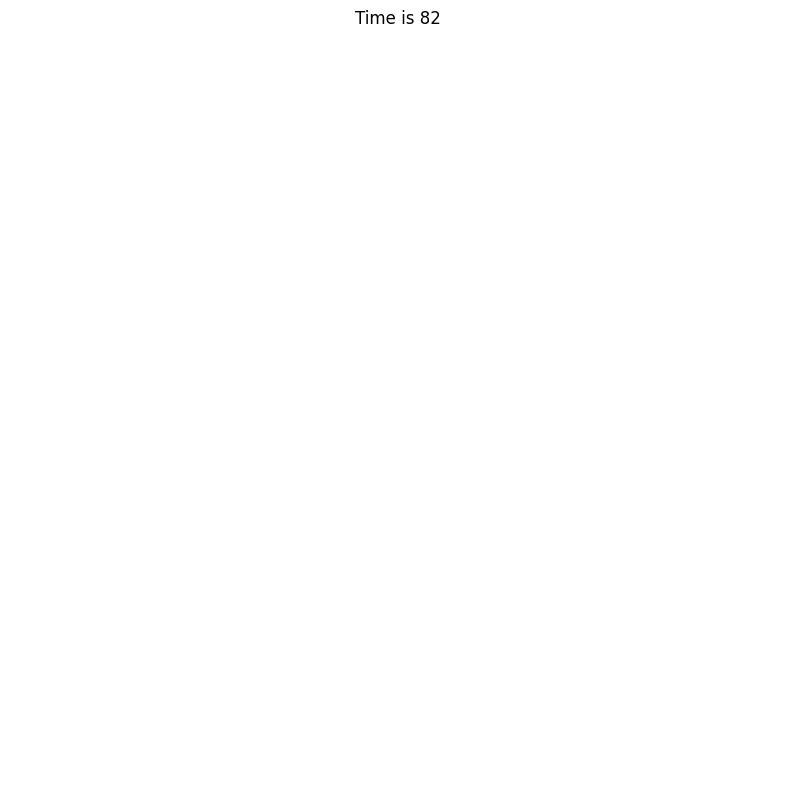

In [8]:
S_color = "white"
I_color = 'firebrick'
R_color = 'steelblue'

node_colors = {"S": S_color, "I": I_color, "R": R_color}
edge_colors = {"S": S_color, "I": I_color, "R": R_color, "OFF": "grey"}
fps = 1
fig = plt.figure(figsize=(10, 10))
anim = hc.contagion_animation(
    fig, H, transition_events, pos, node_colors, edge_colors, fps=fps
)
# FFwriter = animation.FFMpegWriter(fps=fps)
# anim.save('animation.mp4', writer = FFwriter)

In [9]:
HTML(anim.to_jshtml())